# Tornado Alley Climate Model

Here we take general climatic information as well as a dataset of all tornadoes in the US, building a model to use the former to predict some aspects of the distribution of the latter.

### Initial Imports and Loading US Geographical Information

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix

In [3]:
states = gpd.read_file('../cb_2024_us_state_5m.zip')
states_to_remove = ['VI', 'MP', 'AK','HI','PR','AS', 'GU']
states = states[~states['STUSPS'].isin(states_to_remove)]

## Setting up the Climate Data

### Importing Climate Data and Selecting Feature Columns

In [4]:
climate_df = pd.read_csv('../data_download/yearly_climate_data.csv')

climate_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CDSD,CLDD,DP01,DP10,DP1X,...,TAVG,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,DYTS
0,2009,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",184.3,184.3,115.0,54.0,1.0,...,6.26,12.07,0.45,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2010,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",344.1,344.1,95.0,61.0,7.0,...,7.32,12.91,1.72,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2011,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",370.3,370.3,98.0,52.0,5.0,...,7.12,13.00,1.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2012,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",538.1,538.1,NaN,NaN,NaN,...,9.75,16.33,3.17,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2013,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",366.8,366.8,120.0,41.0,3.0,...,6.34,12.06,0.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
689147,2020,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",598.1,598.1,84.0,53.0,4.0,...,11.14,17.23,5.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
689148,2021,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",668.7,668.7,73.0,45.0,11.0,...,11.71,17.83,5.58,NaN,NaN,NaN,NaN,NaN,NaN,NaN
689149,2022,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",724.6,724.6,73.0,40.0,6.0,...,11.04,18.11,3.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN
689150,2023,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",662.8,662.8,79.0,49.0,6.0,...,11.93,18.53,5.33,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
test_years = list(range(1980,1990)) + list(range(2020,2025))

features_to_interpolate = climate_df.columns[5:-1]
redundant_features = ['CDSD','HDSD','TAVG']
special_attributes = ['EMNT', 'EMXP', 'EMXT', 'EMSD', 'EMSN'] # The attributes for these features have extra, and potentially useful, information that we would need to handle with some care
date_features = ['FZF0', 'FZF1', 'FZF2', 'FZF3', 'FZF4', 'FZF5', 'FZF6', 'FZF7', 'FZF8', 'FZF9'] # The values for these features are dates, so we would need to handle them separately
features_to_interpolate = features_to_interpolate.drop(redundant_features)
#features_to_interpolate = features_to_interpolate.drop(special_attributes)
features_to_interpolate = features_to_interpolate.drop(date_features)

reduced_climate_df = pd.concat([climate_df[['DATE','LATITUDE','LONGITUDE','ELEVATION','NAME']],climate_df[features_to_interpolate]],axis=1)


features_to_interpolate = list(features_to_interpolate)
features_to_interpolate

['CLDD',
 'DP01',
 'DP10',
 'DP1X',
 'DT00',
 'DT32',
 'DX32',
 'DX70',
 'DX90',
 'EMNT',
 'EMXP',
 'EMXT',
 'HTDD',
 'PRCP',
 'TMAX',
 'TMIN',
 'DSND',
 'DSNW',
 'EMSD',
 'EMSN',
 'SNOW',
 'DYFG']

### Interpolation to Fill in Missing Values

In [6]:
from data_interpolation import *
reduced_climate_df = remove_nans_interpolator(reduced_climate_df,'LATITUDE','LONGITUDE',features_to_interpolate,'DATE',reduced_climate_df['DATE'].unique())

### Interpolation to Bring Data to a Grid

This won't immediately be used, but we will later have need to convert our irregularly spaced weather data into data on a uniform grid.

In [27]:
from interpolate_to_grid import *

### Code to Create Test Splits

We'll need to separate our data for training and testing our model. This is made somewhat tricky by the fact that most (almost all) weather stations do not report values for all of our attributes, so that values of attributes will need to be determined by interpolation. As such, we'll be doing the following:
* The years 1980-1989 and 2020-2024, inclusive, are to be designated as testing years. All data from these years will be set aside.
* Of the remaining years 1950-1980 and 1990-2020, we'll perform cross validation splits by removing a single decade at a time.

In [7]:
from create_test_splits import *

## Preprocessing the Tornado Data

### Defining Tornado Alley Using A Rescaled KDE

We find it most convenient to group tornado data together into bins of 5 years, associating all 5 of those years with the corresponding distribution

In [8]:
tornado_df = pd.read_csv('../data_download/all_tornadoes.csv')
# There are a very small subset (about 35) of strong tornadoes not having longitude or latitude values. These are removed now.
tornado_df = tornado_df[~tornado_df['begin_lat'].isnull()]
tornado_df = tornado_df[~tornado_df['begin_lon'].isnull()]

# Now, we also restrict ourselves to only working with strong tornadoes.
tornado_df = tornado_df[tornado_df['tor_f_scale'].isin(['F3','F4','F5'])]

def bin_by_year(year):
    return 1950 + ((year-1950) // 5) * 5

tornado_df.loc[:,'year_bin'] = bin_by_year(tornado_df['year'])

tornado_df

,Unnamed: 0,state,begin_lat,begin_lon,tor_f_scale,year,year_bin
0,0,OKLAHOMA,35.1200,-99.2000,F3,1950,1950
6,6,PENNSYLVANIA,40.2000,-76.1200,F3,1950,1950
7,7,PENNSYLVANIA,40.2700,-76.0700,F3,1950,1950
16,16,OKLAHOMA,34.8800,-99.2800,F3,1950,1950
17,17,OKLAHOMA,35.0000,-99.2000,F3,1950,1950
...,...,...,...,...,...,...,...
72427,75183,MISSISSIPPI,31.3773,-90.8606,F3,2024,2020
72509,75270,OKLAHOMA,35.3640,-97.4380,F3,2024,2020
72516,75277,OKLAHOMA,34.2910,-97.9690,F3,2024,2020
72526,75288,OKLAHOMA,35.4000,-97.2420,F3,2024,2020


To proceed, we will need a definition of Tornado Alley. No standard formal definition exists, so we'll work with the following idea:

_Tornado Alley consists of the portions of the US in which strong tornadoes (F3 or higher) occur with the highest frequency._

To obtain such a region we'll use a KDE method to mollify the empirical distribution of tornadoes. 

In [9]:
from kde_generation import *

In using a KDE to define Tornado Alley, we have two highly significant parameters:
* The **bandwidth of the KDE**. A float, this parameter affects how wide a region around a given tornado is allocated 'tornado frequency' points from that tornado.
* The **quantile to remove**. A float between 0 and 1, this is the fraction of yearly tornadoes we'll allow into the KDE. We compute the mean tornado position and the distance of every tornado from that position. Those tornadoes which are furthest from the center are excluded from analysis. This is done to remove the small number of tornadoes which irregularly occur in unusual portions of the country, so as to reduce the variability of the data.

These values here are just sample values, we'll choose these parameters in the relevant sections of this notebook.

In [10]:
BANDWIDTH = .5
QUANTILE_TO_REMOVE = .5

In [11]:
years = np.arange(1950,2025,5)

tornado_kdes = yearly_tornado_distributions(tornado_df, BANDWIDTH, years, QUANTILE_TO_REMOVE)

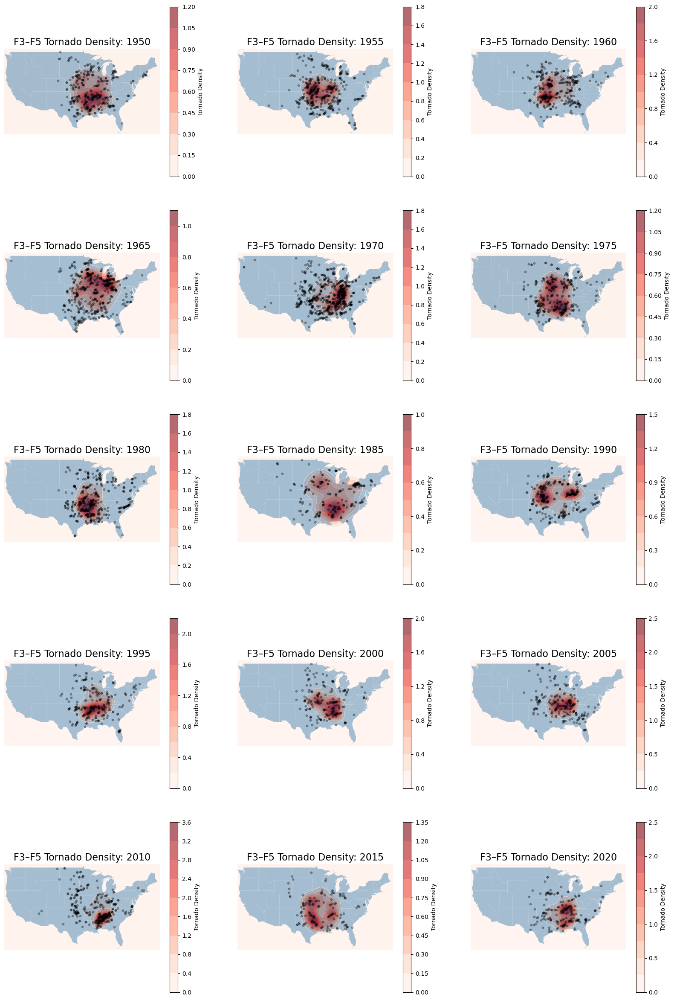

In [12]:
 ## This code block draws a contour plot of the mollified empirical distribution for some selected years, for visualization's sake.

years = np.arange(1950,2025,5)

fig, axs = plt.subplots(5,3)
fig.set_size_inches(20,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    plot_x = ((year - 1950) // 5) % 3
    plot_y = ((year - 1950) // 5) // 3

    density = tornado_kdes(year,positions).reshape(xx.shape)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, density, levels=10, cmap='Reds', alpha=0.6)

    plt.colorbar(contour, ax=ax, label='Tornado Density')

    tornado_x = tornado_df[tornado_df['year_bin']==year]['begin_lon'].values
    tornado_y = tornado_df[tornado_df['year_bin']==year]['begin_lat'].values
    ax.scatter(tornado_x, tornado_y, c='black', s=10, alpha=0.3)

    ax.set_title("F3–F5 Tornado Density: " + str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

## Understanding Tornado Alley as a Regression Problem

### Generating the KDE

First, our two constants needed to define the KDE.

In [13]:
BANDWIDTH = .5
QUANTILE_TO_REMOVE = .9

The 'years' variable below will ultimately serve as bins. A single KDE will be computed for all tornadoes within a bin.

In [14]:
years = np.arange(1950,2025,5)
tornado_kdes = yearly_tornado_distributions(tornado_df, BANDWIDTH, years, QUANTILE_TO_REMOVE)

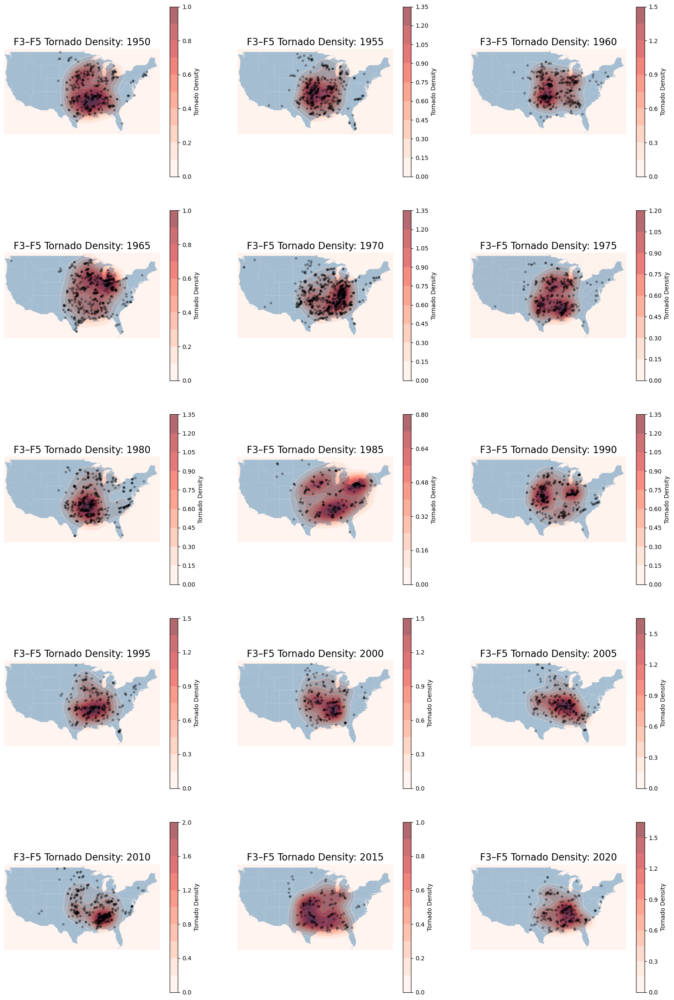

In [15]:
 ## This code block draws a contour plot of the mollified empirical distribution for some selected years, for visualization's sake.

years = np.arange(1950,2025,5)

fig, axs = plt.subplots(5,3)
fig.set_size_inches(20,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    plot_x = ((year - 1950) // 5) % 3
    plot_y = ((year - 1950) // 5) // 3

    density = tornado_kdes(year,positions).reshape(xx.shape)
    #tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, density, levels=10, cmap='Reds', alpha=0.6)


    #xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    #positions = np.vstack([xx.ravel(), yy.ravel()])
    #density = tornado_kdes(year,positions).reshape(xx.shape)

    
    #contour = ax.contourf(xx, yy, density, levels=10, cmap='Reds', alpha=0.6)
    plt.colorbar(contour, ax=ax, label='Tornado Density')

    tornado_x = tornado_df[tornado_df['year_bin']==year]['begin_lon'].values
    tornado_y = tornado_df[tornado_df['year_bin']==year]['begin_lat'].values
    ax.scatter(tornado_x, tornado_y, c='black', s=10, alpha=0.3)

    ax.set_title("F3–F5 Tornado Density: " + str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

### Labeling the Climate Data

In [16]:
def tornado_alley_kde_calc(row):
    return tornado_kdes(row['DATE'],[row['LONGITUDE'],row['LATITUDE']])[0]

In [17]:
kde_climate_df = reduced_climate_df.copy()

kde_climate_df['tornado_alley'] = kde_climate_df.apply(tornado_alley_kde_calc, axis=1)
kde_climate_df = kde_climate_df.reset_index(drop=True)

kde_climate_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
0,2009,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",184.3,115.000000,54.000000,1.000000,3.400000e+01,...,549.700000,12.07,0.45,74.359960,17.120770,457.732142,244.172037,1250.019578,125.573979,0.16689
1,2010,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",344.1,95.000000,61.000000,7.000000,3.200000e+01,...,755.100000,12.91,1.72,98.630914,14.044279,540.627510,125.195027,1069.114304,123.694906,0.29944
2,2011,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",370.3,98.000000,52.000000,5.000000,3.200000e+01,...,632.000000,13.00,1.25,77.418384,10.448963,380.011789,167.381565,913.196317,95.814395,0.29944
3,2012,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",538.1,72.352762,45.921186,3.005618,1.500000e+01,...,557.206593,16.33,3.17,47.831783,8.680312,191.239107,162.175092,763.400547,49.826326,0.29944
4,2013,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",366.8,120.000000,41.000000,3.000000,2.600000e+01,...,547.500000,12.06,0.62,95.901032,16.733666,202.638958,208.159867,1314.865050,66.351549,0.29944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680148,2020,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",598.1,84.000000,53.000000,4.000000,3.000000e+00,...,686.000000,17.23,5.04,36.304437,11.311418,137.144087,123.221535,708.395364,69.526786,0.47330
680149,2021,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",668.7,73.000000,45.000000,11.000000,1.000000e+01,...,792.600000,17.83,5.58,41.267275,8.655709,358.344341,302.375452,839.814951,72.985282,0.47330
680150,2022,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",724.6,73.000000,40.000000,6.000000,1.300000e+01,...,493.300000,18.11,3.98,13.967127,3.058600,67.107032,63.092740,189.364304,38.832051,0.47330
680151,2023,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",662.8,79.000000,49.000000,6.000000,-5.273559e-16,...,611.500000,18.53,5.33,19.875558,5.118656,187.116457,201.823838,496.002090,72.470351,0.47330


It's worth noting the manner in which the data is skewed toward lower values. The two blocks below show the relative sizes of the number of rows with large predictions vs the number of rows with small predictions. This will ultimately cause issues with the analysis.

In [18]:
kde_climate_df[kde_climate_df['tornado_alley'] > .5]

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
11,2010,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",622.394367,89.000000,55.000000,7.000000,5.645935,...,854.000000,16.746180,4.401367,46.531033,2.630865,333.123339,34.806128,145.204262,126.335552,0.511174
12,2011,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",604.751355,90.000000,54.000000,9.000000,12.186584,...,813.300000,16.754741,3.621605,57.532444,4.228695,298.604715,195.570580,457.470610,115.716363,0.511174
13,2012,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",728.499665,54.000000,31.000000,6.000000,4.478715,...,499.300000,19.714509,4.666408,27.140724,0.704922,273.016838,149.996194,174.858100,61.010559,0.511174
14,2013,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",633.644120,77.000000,46.000000,7.000000,5.083088,...,727.900000,16.583687,3.508234,43.425275,1.878817,268.858922,74.986406,145.779884,70.073363,0.511174
15,2014,40.5093,-98.5493,601.1,"JUNIATA 6.0 SSW, NE US",549.887315,80.000000,39.000000,7.000000,11.603851,...,668.400000,16.880374,3.433207,28.886969,3.818082,91.007449,45.796990,196.598079,77.114574,0.511174
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680138,2010,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",621.600000,103.000000,58.000000,8.000000,9.000000,...,777.000000,16.220000,4.770000,64.451310,6.190403,332.821653,68.517987,312.540423,128.825619,0.523202
680139,2011,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",619.400000,99.000000,55.000000,8.000000,7.000000,...,783.500000,16.720000,4.590000,49.577152,7.853125,188.167159,107.665236,593.227496,125.382257,0.523202
680140,2012,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",783.800000,62.000000,36.000000,4.000000,3.000000,...,493.100000,19.740000,5.790000,28.104832,2.889470,202.460964,183.481337,309.173277,17.291844,0.523202
680141,2013,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",602.400000,70.931012,46.464850,7.777856,5.000000,...,733.677691,16.310000,3.960000,34.734965,5.778940,152.000000,137.972187,548.276910,19.266116,0.523202


In [19]:
kde_climate_df[kde_climate_df['tornado_alley'] <= .5]

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
0,2009,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",184.3,115.000000,54.000000,1.000000,3.400000e+01,...,549.700000,12.07,0.45,74.359960,17.120770,457.732142,244.172037,1250.019578,125.573979,0.16689
1,2010,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",344.1,95.000000,61.000000,7.000000,3.200000e+01,...,755.100000,12.91,1.72,98.630914,14.044279,540.627510,125.195027,1069.114304,123.694906,0.29944
2,2011,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",370.3,98.000000,52.000000,5.000000,3.200000e+01,...,632.000000,13.00,1.25,77.418384,10.448963,380.011789,167.381565,913.196317,95.814395,0.29944
3,2012,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",538.1,72.352762,45.921186,3.005618,1.500000e+01,...,557.206593,16.33,3.17,47.831783,8.680312,191.239107,162.175092,763.400547,49.826326,0.29944
4,2013,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",366.8,120.000000,41.000000,3.000000,2.600000e+01,...,547.500000,12.06,0.62,95.901032,16.733666,202.638958,208.159867,1314.865050,66.351549,0.29944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680148,2020,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",598.1,84.000000,53.000000,4.000000,3.000000e+00,...,686.000000,17.23,5.04,36.304437,11.311418,137.144087,123.221535,708.395364,69.526786,0.47330
680149,2021,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",668.7,73.000000,45.000000,11.000000,1.000000e+01,...,792.600000,17.83,5.58,41.267275,8.655709,358.344341,302.375452,839.814951,72.985282,0.47330
680150,2022,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",724.6,73.000000,40.000000,6.000000,1.300000e+01,...,493.300000,18.11,3.98,13.967127,3.058600,67.107032,63.092740,189.364304,38.832051,0.47330
680151,2023,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",662.8,79.000000,49.000000,6.000000,-5.273559e-16,...,611.500000,18.53,5.33,19.875558,5.118656,187.116457,201.823838,496.002090,72.470351,0.47330


### Some Initial Analysis and Model Selection

A number of different models were attempted with the data. Nonlinear models had the most success. We highlight a few of these here along with their mean absolute error for cross validation data.

In [20]:
from sklearn.metrics import mean_squared_error,mean_absolute_error

features = features_to_interpolate

There's relatively little reason to think that a linear regression model will be sufficient as a predictor. Nonetheless, it's worth trying.

In [21]:
from sklearn.linear_model import Ridge
from sklearn.kernel_approximation import RBFSampler

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
ridge_ker_pipe = make_pipeline(StandardScaler(),RBFSampler(gamma = .02),Ridge(alpha = .5))
ridge_ker_scores = cross_val_score(ridge_ker_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
print(ridge_ker_scores)

[-0.15141929 -0.15670013 -0.15498267 -0.15644499 -0.15701269 -0.1592943 ]


In [22]:
from sklearn.svm import LinearSVR

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
svr_pipe = make_pipeline(StandardScaler(),RBFSampler(gamma = .1),LinearSVR(epsilon=0.001,C=1))
svr_scores = cross_val_score(svr_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
print(svr_scores)

[-0.15564871 -0.15276498 -0.1667475  -0.15709643 -0.16312515 -0.15058976]


In [23]:
from sklearn.neighbors import KNeighborsRegressor

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
knr_pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=11))
knr_scores = cross_val_score(knr_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
print(knr_scores)

[-0.13353843 -0.13791282 -0.13922516 -0.12587776 -0.12733912 -0.13224663]


The Gradient Boosting Regressor performed even better than kNN, but concerns about overfitting led us to use the kNN model anyway.

In [25]:
from sklearn.ensemble import HistGradientBoostingRegressor

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
grad_pipe = make_pipeline(HistGradientBoostingRegressor(learning_rate=.1,l2_regularization=1))
grad_scores = cross_val_score(grad_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
print(grad_scores)

[-0.12496398 -0.1299528  -0.12940335 -0.12044309 -0.12425581 -0.13516779]


### Optimizing the Parameters of kNN Regression

Having decided to use kNN Regression, we use cross validation to determine the right number of neighbors to achieve the best fit.

In [24]:
mean_scores = []
for i in range(5,15):
    train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
    knr_pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=i))
    knr_scores = cross_val_score(knr_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
    print(str(i) + " neighbors model completed.")
    mean_scores.append(np.mean(knr_scores))

5 neighbors model completed.
6 neighbors model completed.
7 neighbors model completed.
8 neighbors model completed.
9 neighbors model completed.
10 neighbors model completed.
11 neighbors model completed.
12 neighbors model completed.
13 neighbors model completed.
14 neighbors model completed.


In [28]:
for i in range(15,20):
    train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
    knr_pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=i))
    knr_scores = cross_val_score(knr_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='neg_mean_absolute_error')
    print(str(i) + " neighbors model completed.")
    mean_scores.append(np.mean(knr_scores))

15 neighbors model completed.
16 neighbors model completed.
17 neighbors model completed.
18 neighbors model completed.
19 neighbors model completed.


Concerns about overfitting and the run-time of the model will prevent us from using more than 19 neighbors.

In [29]:
np.argmax(mean_scores) + 5

np.int64(19)

### Some Visualization for the Selected Model Applied to Cross Validation Data

To manipulate the cross validation predicted data most effectively, we generate the dataframe 'predictions_df'. This dataframe contains only data in non-testing years (1950-1980 and 1990-2020), with each decade inserted from the cross validation set in which that decade makes up the testing data. As such, this data contains all cross validation test data we can work with.

In [31]:
num_neighbors = 19
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)


predictions = []
for train_indices, test_indices in cv_splits:
    pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=num_neighbors))

    train_data = remaining_kde_df.iloc[train_indices].copy()
    test_data = remaining_kde_df.iloc[test_indices].copy()

    pipe.fit(train_data[features],train_data['tornado_alley'])
    test_predicts = pipe.predict(test_data[features])

    #test_data['predictions'] = test_predicts
    test_data['predictions'] = test_predicts

    predictions.append(test_data)

predictions_df = pd.concat(predictions,axis=0)

In [32]:
predictions_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley,predictions
73244,1950,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1341.735086,104.000000,77.000000,14.000000,0.000000,...,26.067506,12.622880,0.000000,0.000000,0.000000,0.000000,0.000000,30.141174,0.398307,0.218052
73245,1957,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1311.032930,95.000000,77.000000,14.000000,0.000000,...,25.515139,13.456971,0.000000,0.000000,0.000000,0.000000,0.000000,32.607199,0.156458,0.292431
73246,1958,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1266.894815,90.000000,73.000000,13.000000,0.000000,...,24.575579,11.766309,1.000000,1.000000,25.000000,25.000000,25.000000,35.907665,0.156458,0.564971
73247,1959,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1297.643358,96.000000,79.000000,17.000000,0.000000,...,25.029862,12.686546,0.000000,0.000000,0.000000,0.000000,0.000000,10.541029,0.156458,0.522001
73322,1950,34.41667,-87.31667,302.1,"ADDISON CENTRAL TOWER, AL US",935.780952,124.129893,83.896073,19.342884,0.000000,...,21.841915,10.787106,1.000000,1.000000,76.000000,76.000000,76.000000,62.732118,0.754171,0.487286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680143,2015,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",571.700000,109.000000,67.000000,10.000000,10.000000,...,17.670000,5.470000,21.728947,3.737868,257.913558,70.422663,267.688305,76.145173,0.488862,0.593791
680144,2016,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",654.100000,87.000000,52.000000,9.000000,6.000000,...,18.360000,6.310000,24.618878,4.831510,183.668195,155.904403,526.851372,70.522834,0.488862,0.615091
680145,2017,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",579.400000,84.000000,57.000000,9.000000,6.000000,...,17.980000,5.540000,15.519591,3.943548,92.827091,83.822394,258.722362,57.792966,0.488862,0.588461
680146,2018,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",651.000000,103.000000,66.000000,9.000000,7.000000,...,16.170000,4.380000,50.084134,13.723489,142.883543,162.080228,1060.386763,78.184530,0.488862,0.636622


Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


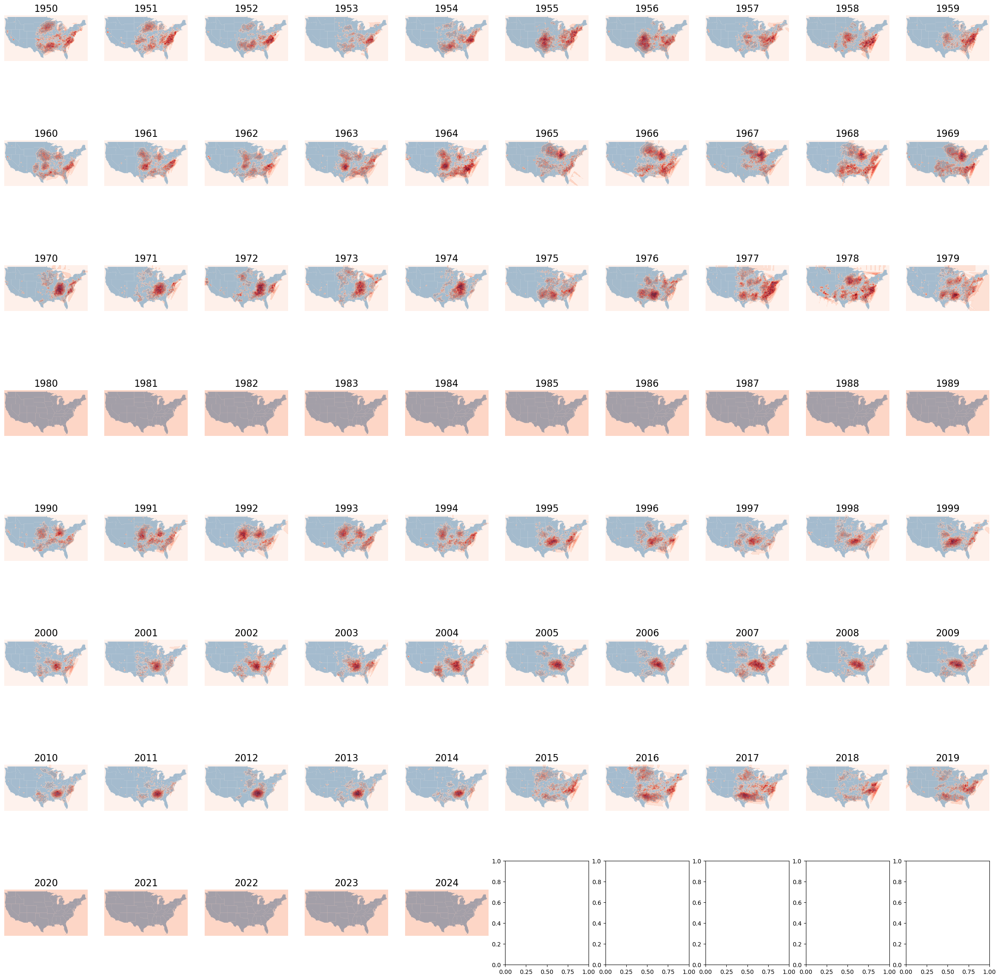

In [35]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

grid_pred_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique(),'predictions')
grid_truth_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique(),'tornado_alley')

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    year_preds = np.zeros(xx.shape)
    year_truth = np.zeros(xx.shape)

    year_pred_df = grid_pred_df[grid_pred_df['DATE'] == year]
    year_truth_df = grid_truth_df[grid_truth_df['DATE'] == year]
    if year_pred_df.shape[0] != 0:
        year_preds = np.array(year_pred_df['preds']).reshape(xx.shape)
        year_truth = np.array(year_truth_df['preds']).reshape(xx.shape)

    error = np.abs(year_preds - year_truth)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, error, cmap='Reds', alpha=0.6)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

### The Main Train-Test Split

Moving past cross validation, we examine the model's behavior when trained on the entire testing set, and we'll examine the predicted values in the 1980s and 2020-2024.

In [36]:
num_neighbors = 19
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features_to_interpolate)

knn_pipe = make_pipeline(StandardScaler(),KNeighborsRegressor(n_neighbors=num_neighbors))
knn_pipe.fit(train_df[features],train_df['tornado_alley'])
test_predicts = knn_pipe.predict(test_df[features])
test_df['predictions'] = test_predicts

predictions_df = test_df.copy()

C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\3711152813.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['predictions'] = test_predicts


Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


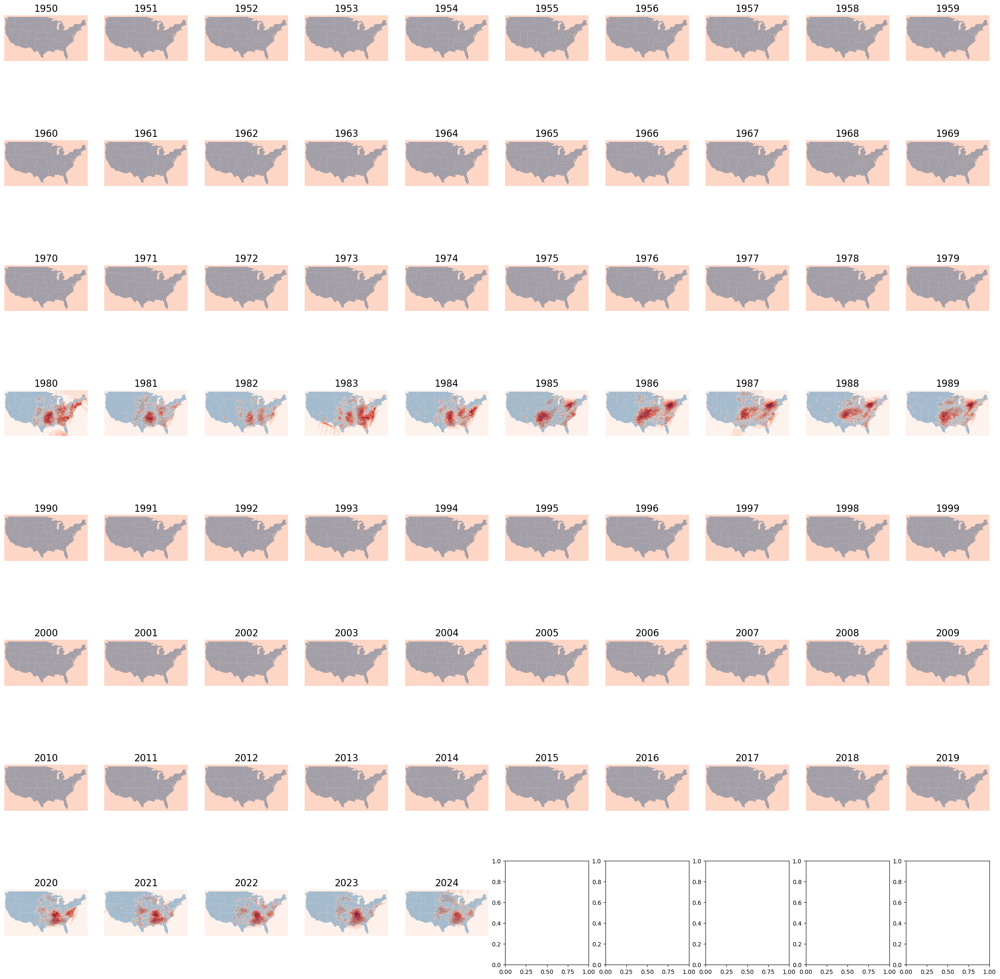

In [38]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

grid_pred_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique(),'predictions')
grid_truth_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique(),'tornado_alley')

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    year_preds = np.zeros(xx.shape)
    year_truth = np.zeros(xx.shape)

    year_pred_df = grid_pred_df[grid_pred_df['DATE'] == year]
    year_truth_df = grid_truth_df[grid_truth_df['DATE'] == year]
    if year_pred_df.shape[0] != 0:
        year_preds = np.array(year_pred_df['preds']).reshape(xx.shape)
        year_truth = np.array(year_truth_df['preds']).reshape(xx.shape)

    error = np.abs(year_preds - year_truth)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, error, cmap='Reds', alpha=0.6)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

This code generates images displaying in greater detail the quality of the result for each of the test years.

In [39]:
def ground_truth_regression_plot(predict_df,year,grid_xx,grid_yy,density,ax):
    states.plot(ax=ax)

    ax.contourf(grid_xx, grid_yy, density, levels=10, cmap='Reds', alpha=0.6)
    plt.colorbar(contour, ax=ax)

    ax.set_title(str(year) + " Estimated F3-F5 Tornado Density", fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def predict_tornado_alley_regression_plot(grid_predict_df,grid_truth_df,year,grid_xx,grid_yy,grid_positions,ax):
    year_pred_df = grid_predict_df[grid_predict_df['DATE'] == year]

    year_preds = np.array(year_pred_df['preds']).reshape(grid_xx.shape)

    states.plot(ax=ax)

    contour = ax.contourf(grid_xx, grid_yy, year_preds, cmap='Reds', alpha=0.6)
    plt.colorbar(contour, ax=ax)

    ax.set_title(str(year) + ' Predicted Tornado Density', fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax


def error_tornado_alley_regression_plot(grid_predict_df,grid_truth_df,year,grid_xx,grid_yy,grid_positions,ax):
    year_pred_df = grid_predict_df[grid_predict_df['DATE'] == year]
    year_truth_df = grid_truth_df[grid_truth_df['DATE'] == year]


    year_preds = np.array(year_pred_df['preds']).reshape(grid_xx.shape)
    year_truth = np.array(year_truth_df['preds']).reshape(grid_xx.shape)

    error = np.abs(year_preds - year_truth)

    states.plot(ax=ax)

    contour = ax.contourf(grid_xx, grid_yy, error, cmap='Reds', alpha=0.6)
    plt.colorbar(contour, ax=ax)

    ax.set_title(str(year) + ' Errors in Predictions', fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def regression_year_plot(predict_df,year,grid_xx,grid_yy,grid_positions):
    
    density = tornado_kdes(year,grid_positions).reshape(grid_xx.shape)

    ground_truth_regression_plot(predict_df,year,grid_xx,grid_yy,density,axs[0])

    grid_pred_df = predictions_to_grid(predict_df,positions.transpose(),[year],'predictions')
    grid_truth_df = predictions_to_grid(predict_df,positions.transpose(),[year],'tornado_alley')
    predict_tornado_alley_regression_plot(grid_pred_df,grid_truth_df,year,grid_xx,grid_yy,grid_positions,axs[1])
    error_tornado_alley_regression_plot(grid_pred_df,grid_truth_df,year,grid_xx,grid_yy,grid_positions,axs[2])

    return (fig, axs)

In [40]:
years = list(range(1980,1990)) + list(range(2020,2025))

plt.ioff()

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:200j, ymin:ymax:200j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    fig, axs = plt.subplots(1,3,figsize=(30,10))
    fig, axs = regression_year_plot(predictions_df, year, xx, yy, positions)
    fig.savefig('generated_images/regression_' + str(year) + '.png')

C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\709994821.py:5: UserWarning: Adding colorbar to a different Figure <Figure size 3000x3000 with 80 Axes> than <Figure size 3000x1000 with 4 Axes> which fig.colorbar is called on.
  plt.colorbar(contour, ax=ax)
C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\709994821.py:5: UserWarning: Adding colorbar to a different Figure <Figure size 3000x3000 with 80 Axes> than <Figure size 3000x1000 with 4 Axes> which fig.colorbar is called on.
  plt.colorbar(contour, ax=ax)
C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\709994821.py:5: UserWarning: Adding colorbar to a different Figure <Figure size 3000x3000 with 80 Axes> than <Figure size 3000x1000 with 4 Axes> which fig.colorbar is called on.
  plt.colorbar(contour, ax=ax)
C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_35800\709994821.py:5: UserWarning: Adding colorbar to a different Figure <Figure size 3000x3000 with 80 Axes> than <Figure size

In [ ]:
plt.ion()
plt.show()

### Analyzing the Quality of the Result

Even before looking at the numbers, we can see some issues with our model's behavior. It _is_ successfully producing small errors across most of the country. Moreover, it is accurately suggesting that the Midwest and/or Southeast are at the highest risk. However, it's errors are dramatically larger than average in this region.

In [42]:
mean_squared_error(predictions_df['tornado_alley'],predictions_df['predictions'])

0.050921057811692136

In [43]:
mean_absolute_error(predictions_df['tornado_alley'],predictions_df['predictions'])

0.1386719203701973

Both of these values are fairly small, so it's not necessarily a bad model. On the other hand, we can restrict our attention to the points where the truth is large.

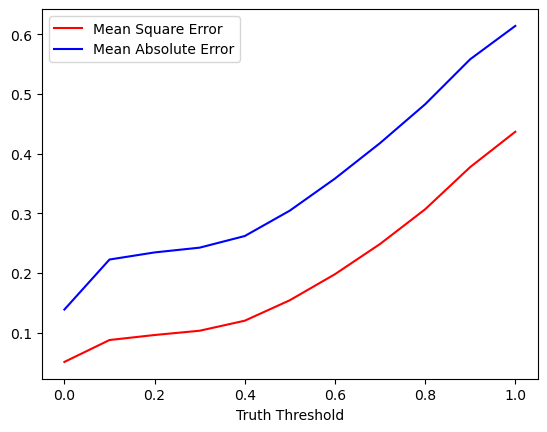

In [53]:
thresholds = np.linspace(0,1,11)
sq_errors = []
abs_errors = []
for val in thresholds:
    large_val_df = predictions_df[predictions_df['tornado_alley'] > val]
    sq_errors.append(mean_squared_error(large_val_df['tornado_alley'],large_val_df['predictions']))
    abs_errors.append(mean_absolute_error(large_val_df['tornado_alley'],large_val_df['predictions']))

plt.plot(thresholds,sq_errors,c='red',label='Mean Square Error')
plt.plot(thresholds,abs_errors,c='blue',label='Mean Absolute Error')
plt.xlabel('Truth Threshold')
plt.legend()
plt.show()

Notably, our model performs worse and worse as the threshold grows. There seem to be two reasons for this. 
* First, very little of the data has a high ground-truth value. As such, the regression model is strongly encouraged to be accurate for low ground-truth points and less strongly for high ground-truth points. Perhaps more heavily weighting points with high tornado risk could ameliorate this issue.
* Second, even with 5 year bins for the KDEs defining the ground truth values, there is fairly extreme variation in ground truth. Tornado occurences are highly variable, and there is a lot of complexity in the shape of the KDE for each bin. Our data does not seem to have sufficient predictive power to fully capture this complexity. To help mitigate this issue, we have the next section of the notebook.

## Simplifying to a Classification Problem

### Generating the KDE

First, we have our three constants needed for this section.

In [ ]:
BANDWIDTH = .5
QUANTILE_TO_REMOVE = .5
REQUIRED_FREQ = .5

In [ ]:
years = np.arange(1950,2025,5)

tornado_kdes = yearly_tornado_distributions(tornado_df, BANDWIDTH, years, QUANTILE_TO_REMOVE)

### Labeling the Climate Data

In [26]:
def tornado_alley_classification(lat,lon,year):
    '''
        Given floats lat and lon representing the latitude and longitude of a point and an int year representing the year,
        outputs 1 if the point falls within tornado alley and a 0 otherwise.
    '''
    return int(tornado_kdes(year,[lon,lat])[0] > REQUIRED_FREQ)

def tornado_alley_calc(row):
    return tornado_alley_classification(row['LATITUDE'],row['LONGITUDE'],row['DATE'])

In [27]:
kde_climate_df = reduced_climate_df.copy()

kde_climate_df['tornado_alley'] = kde_climate_df.apply(tornado_alley_calc, axis=1)
kde_climate_df = remove_nans_interpolator(kde_climate_df,'LATITUDE','LONGITUDE',features_to_interpolate,'DATE',kde_climate_df['DATE'].unique())
kde_climate_df = kde_climate_df.reset_index(drop=True)

kde_climate_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
0,2009,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",184.3,115.000000,54.000000,1.000000,3.400000e+01,...,549.700000,12.07,0.45,74.359960,17.120770,457.732142,244.172037,1250.019578,125.573979,0
1,2010,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",344.1,95.000000,61.000000,7.000000,3.200000e+01,...,755.100000,12.91,1.72,98.630914,14.044279,540.627510,125.195027,1069.114304,123.694906,0
2,2011,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",370.3,98.000000,52.000000,5.000000,3.200000e+01,...,632.000000,13.00,1.25,77.418384,10.448963,380.011789,167.381565,913.196317,95.814395,0
3,2012,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",538.1,72.352762,45.921186,3.005618,1.500000e+01,...,557.206593,16.33,3.17,47.831783,8.680312,191.239107,162.175092,763.400547,49.826326,0
4,2013,43.7333,-96.6333,482.0,"SIOUX FALLS ENVIRON. CANADA, SD US",366.8,120.000000,41.000000,3.000000,2.600000e+01,...,547.500000,12.06,0.62,95.901032,16.733666,202.638958,208.159867,1314.865050,66.351549,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680110,2020,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",598.1,84.000000,53.000000,4.000000,3.000000e+00,...,686.000000,17.23,5.04,36.304437,11.311418,137.144087,123.221535,708.395364,69.526786,0
680111,2021,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",668.7,73.000000,45.000000,11.000000,1.000000e+01,...,792.600000,17.83,5.58,41.267275,8.655709,358.344341,302.375452,839.814951,72.985282,0
680112,2022,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",724.6,73.000000,40.000000,6.000000,1.300000e+01,...,493.300000,18.11,3.98,13.967127,3.058600,67.107032,63.092740,189.364304,38.832051,0
680113,2023,40.6954,-96.8541,418.2,"LINCOLN 11 SW, NE US",662.8,79.000000,49.000000,6.000000,-5.273559e-16,...,611.500000,18.53,5.33,19.875558,5.118656,187.116457,201.823838,496.002090,72.470351,0


In [28]:
kde_climate_df[kde_climate_df['tornado_alley']==1]

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,PRCP,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley
1249,2017,40.40670,-97.37390,479.1,"TOBIAS 2.1 WSW, NE US",595.398306,70.00000,46.000000,5.000000,6.578917,...,610.900000,18.265532,4.777092,16.583362,2.650375,88.942215,105.872694,269.313883,19.892806,1
1250,2018,40.40670,-97.37390,479.1,"TOBIAS 2.1 WSW, NE US",677.427411,85.00000,53.000000,10.000000,9.315668,...,871.700000,16.279938,3.591808,47.826780,10.655611,130.911417,143.974043,829.971810,21.067247,1
1251,2019,40.40670,-97.37390,479.1,"TOBIAS 2.1 WSW, NE US",574.981718,94.00000,70.000000,14.000000,13.447420,...,1140.500000,15.652326,3.664545,53.114305,9.000000,299.171222,206.715790,961.395233,45.001842,1
1494,2018,40.05250,-96.57740,367.0,"BARNESTON 0.3 N, NE US",868.342153,83.00000,47.000000,11.000000,13.720189,...,857.700000,17.647818,4.501646,25.015723,10.815585,144.695818,135.691054,774.273733,13.958699,1
1495,2019,40.05250,-96.57740,367.0,"BARNESTON 0.3 N, NE US",738.363743,92.00000,56.000000,12.000000,8.868571,...,957.300000,17.031629,4.521422,37.423164,9.833638,180.749242,146.786517,692.793308,14.033870,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
679573,2017,40.07912,-95.58928,298.8,"FALLS CITY BRENNER FIELD, NE US",675.400000,83.00000,55.000000,5.000000,7.000000,...,751.100000,18.900000,6.430000,11.293798,2.000000,53.695033,68.824627,113.943342,123.000000,1
679574,2018,40.07912,-95.58928,298.8,"FALLS CITY BRENNER FIELD, NE US",827.200000,91.00000,52.000000,10.000000,8.000000,...,819.000000,17.640000,5.270000,41.737031,11.524161,143.709584,128.825473,599.778119,143.000000,1
679575,2019,40.07912,-95.58928,298.8,"FALLS CITY BRENNER FIELD, NE US",724.300000,107.00000,62.000000,8.000000,5.000000,...,1084.200000,16.780000,5.600000,54.876236,11.238772,209.034279,125.350673,896.120873,156.000000,1
679832,1998,41.61334,-90.59484,227.5,"DAVENPORT MUNICIPAL AIRPORT, IA US",500.300000,143.22678,81.363867,12.876183,4.000000,...,1220.180346,16.200000,6.200000,30.231965,5.143844,143.595710,70.543925,380.699063,155.236303,1


### Applying A Variety of Classification Models to the Cross Validation Data

In [29]:
features = features_to_interpolate

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
num_neighbors = 11

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
knn_pipe = make_pipeline(StandardScaler(),KNeighborsClassifier(n_neighbors=num_neighbors))
knn_scores = cross_val_score(knn_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(knn_scores)

[0.41269841 0.31090487 0.27617936 0.3838961  0.43350063 0.40345131]


In [30]:
means = []
for i in range(5,15):
    train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features)
    knn_pipe = make_pipeline(StandardScaler(),KNeighborsClassifier(n_neighbors=i))
    knn_scores = cross_val_score(knn_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
    print(knn_scores)
    means.append(np.mean(knn_scores))

ERROR! Session/line number was not unique in database. History logging moved to new session 47
[0.4107387  0.32519758 0.29324867 0.38810251 0.42346787 0.39348187]
[0.36218893 0.28016534 0.23514743 0.34451649 0.3648621  0.36389936]
[0.41235961 0.32070109 0.28714058 0.38438018 0.42833668 0.39833602]
[0.36732148 0.28410652 0.24330259 0.34904209 0.38037225 0.37308895]
[0.41147401 0.31505857 0.28033586 0.38426821 0.43270658 0.40247187]
[0.37412762 0.28479685 0.24132619 0.35311345 0.39006228 0.37841105]
[0.41269841 0.31090487 0.27617936 0.3838961  0.43350063 0.40345131]
[0.38110608 0.280982   0.23786408 0.35712793 0.39158181 0.38490955]
[0.41371336 0.30579986 0.26792794 0.38657559 0.43186876 0.40573407]
[0.3852082  0.28049902 0.23458891 0.36182653 0.39679739 0.38710231]


In [ ]:
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years)
logistic_pipe_no_reg = make_pipeline(StandardScaler(),LogisticRegression(penalty=None))
logistic_no_reg_scores = cross_val_score(logistic_pipe_no_reg,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(logistic_no_reg_scores)

[0.17845817 0.12655827 0.07517855 0.07852302 0.08994032 0.24385131]


In [ ]:
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years)
logistic_pipe_reg = make_pipeline(StandardScaler(),LogisticRegression())
logistic_reg_scores = cross_val_score(logistic_pipe_reg,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(logistic_reg_scores)

[0.17832168 0.12686365 0.07491857 0.07721104 0.09232078 0.24407964]


In [ ]:
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years)
svm_pipe_reg = make_pipeline(StandardScaler(),LinearSVC())
svm_reg_scores = cross_val_score(svm_pipe_reg,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(svm_reg_scores)

[0.04862987 0.01268834 0.00708254 0.00403009 0.00137441 0.05859897]


In [ ]:
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years)
svm_rbf_kernel_pipe = make_pipeline(StandardScaler(),RBFSampler(gamma=0.009,random_state=17),LinearSVC(C=.5))
svm_rbf_kernel_scores = cross_val_score(svm_rbf_kernel_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(svm_rbf_kernel_scores)

[0.11692759 0.12059248 0.15668639 0.13717389 0.08955224 0.36357876]


In [ ]:
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years)
decision_tree_pipe = make_pipeline(tree.DecisionTreeClassifier())
decision_tree_scores = cross_val_score(decision_tree_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(decision_tree_scores)
# Especially with the decision tree, it would be nice to see what's happening under the hood
#plt.figure(figsize = (20,10))
#tree.plot_tree(decision_tree_pipe[0],feature_names=features,max_depth=5)
#plt.show()

[0.30888286 0.24139415 0.31540183 0.31368835 0.35968304 0.31294562]


In [ ]:
num_trees = 20

train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years)
random_forest_pipe = make_pipeline(RandomForestClassifier(n_estimators = num_trees))
random_forest_scores = cross_val_score(random_forest_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(decision_tree_scores)

[0.30888286 0.24139415 0.31540183 0.31368835 0.35968304 0.31294562]


In [ ]:
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years)
grad_boosting_pipe = make_pipeline(StandardScaler(),HistGradientBoostingClassifier())
grad_boosting_scores = cross_val_score(grad_boosting_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
print(grad_boosting_scores)

[0.25043765 0.20832043 0.26107363 0.29021218 0.25225225 0.37179063]


### Choosing Optimal SVM Parameters

In [ ]:
def mean_svm_cv_result(gamma,C,random_state):
    train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years)
    svm_rbf_kernel_pipe = make_pipeline(StandardScaler(),RBFSampler(gamma=gamma,random_state=random_state),LinearSVC(C=C))
    svm_rbf_kernel_scores = cross_val_score(svm_rbf_kernel_pipe,remaining_kde_df[features],y=remaining_kde_df['tornado_alley'],cv=cv_splits,scoring='f1')
    return np.mean(svm_rbf_kernel_scores)

In [ ]:
random_state = 17
gammas = []
Cs = []
svm_score = []

In [ ]:
gamma = .01
C = 3
gammas.append(gamma)
Cs.append(C)
svm_score.append(mean_svm_cv_result(gamma,C,random_state))

In [ ]:
gamma = .01
C = .5
gammas.append(gamma)
Cs.append(C)
svm_score.append(mean_svm_cv_result(gamma,C,random_state))

In [ ]:
print(np.max(svm_score))
print(gammas[np.argmax(svm_score)])
print(Cs[np.argmax(svm_score)])

0.5035928346326348
0.01
5


C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_536\2093015043.py:4: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


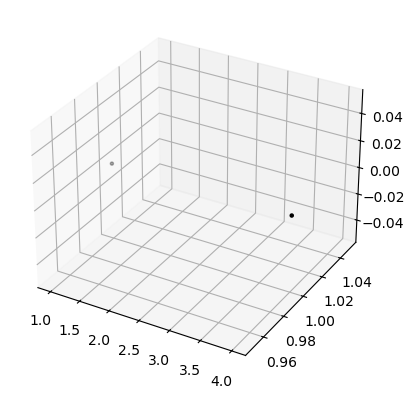

In [ ]:
fig,ax = plt.subplots(subplot_kw={"projection": "3d"})

ax.scatter(gammas,Cs,svm_score,color='black',marker='.')
fig.show()

### Some Visualization

In [32]:
#gamma = .009
#C=1
num_neighbors = 7
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years)


predictions = []
for train_indices, test_indices in cv_splits:
    #svm_rbf_kernel_pipe = make_pipeline(StandardScaler(),RBFSampler(gamma=gamma,random_state=random_state),LinearSVC(C=5))
    knn_pipe = make_pipeline(StandardScaler(),KNeighborsClassifier(n_neighbors=num_neighbors))
    train_data = remaining_kde_df.iloc[train_indices].copy()
    test_data = remaining_kde_df.iloc[test_indices].copy()

    #svm_rbf_kernel_pipe.fit(train_data[features],train_data['tornado_alley'])
    knn_pipe.fit(train_data[features],train_data['tornado_alley'])
    #test_predicts = svm_rbf_kernel_pipe.decision_function(test_data[features])
    test_predicts = knn_pipe.predict_proba(test_data[features])

    #test_data['predictions'] = test_predicts
    test_data['predictions'] = test_predicts[:,1]

    predictions.append(test_data)

predictions_df = pd.concat(predictions,axis=0)

TypeError: create_all_test_train_splits() missing 1 required positional argument: 'features_to_interpolate'

In [ ]:
predictions_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley,predictions
73228,1950,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1341.735086,104.000000,77.000000,14.000000,0.000000,...,26.067506,12.622880,0.000000,0.000000,0.000000,0.000000,0.000000,30.141174,0,0.000000
73229,1957,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1311.032930,95.000000,77.000000,14.000000,0.000000,...,25.515139,13.456971,0.000000,0.000000,0.000000,0.000000,0.000000,32.607199,0,0.090909
73230,1958,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1266.894815,90.000000,73.000000,13.000000,0.000000,...,24.575579,11.766309,1.000000,1.000000,25.000000,25.000000,25.000000,35.907665,0,0.181818
73231,1959,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1297.643358,96.000000,79.000000,17.000000,0.000000,...,25.029862,12.686546,0.000000,0.000000,0.000000,0.000000,0.000000,10.541029,0,0.090909
73306,1950,34.41667,-87.31667,302.1,"ADDISON CENTRAL TOWER, AL US",935.780952,124.129893,83.896073,19.342884,0.000000,...,21.841915,10.787106,1.000000,1.000000,76.000000,76.000000,76.000000,62.732118,1,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680105,2015,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",571.700000,109.000000,67.000000,10.000000,10.000000,...,17.670000,5.470000,21.728947,3.737868,257.913558,70.422663,267.688305,76.145173,0,0.272727
680106,2016,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",654.100000,87.000000,52.000000,9.000000,6.000000,...,18.360000,6.310000,24.618878,4.831510,183.668195,155.904403,526.851372,70.522834,0,0.363636
680107,2017,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",579.400000,84.000000,57.000000,9.000000,6.000000,...,17.980000,5.540000,15.519591,3.943548,92.827091,83.822394,258.722362,57.792966,0,0.181818
680108,2018,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",651.000000,103.000000,66.000000,9.000000,7.000000,...,16.170000,4.380000,50.084134,13.723489,142.883543,162.080228,1060.386763,78.184530,0,0.181818


Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


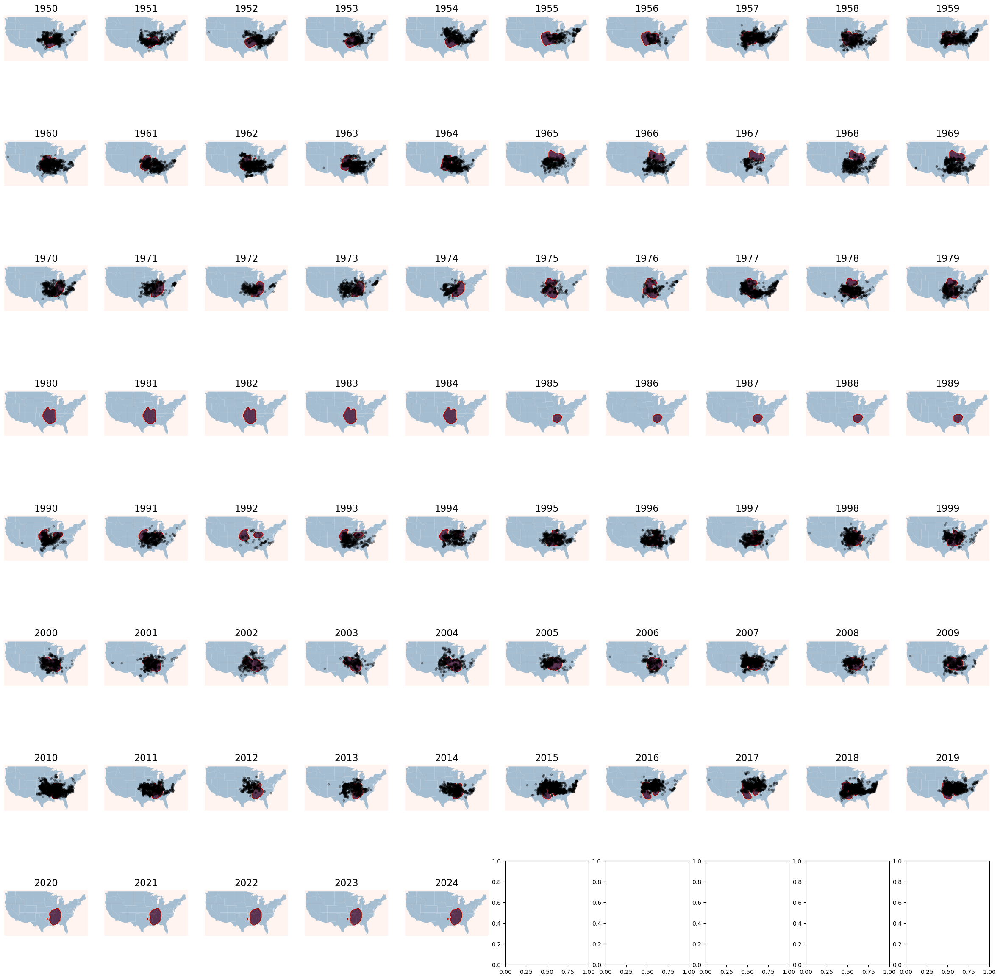

In [ ]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    density = tornado_kdes(year,positions).reshape(xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    year_predictions = predictions_df[predictions_df['DATE'] == year]
    year_predictions = year_predictions[year_predictions['predictions'] > 0.5]
 
    pos_pts_x = year_predictions['LONGITUDE'].values
    pos_pts_y = year_predictions['LATITUDE'].values

    ax.scatter(pos_pts_x, pos_pts_y, c='black', s=10, alpha=0.3)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


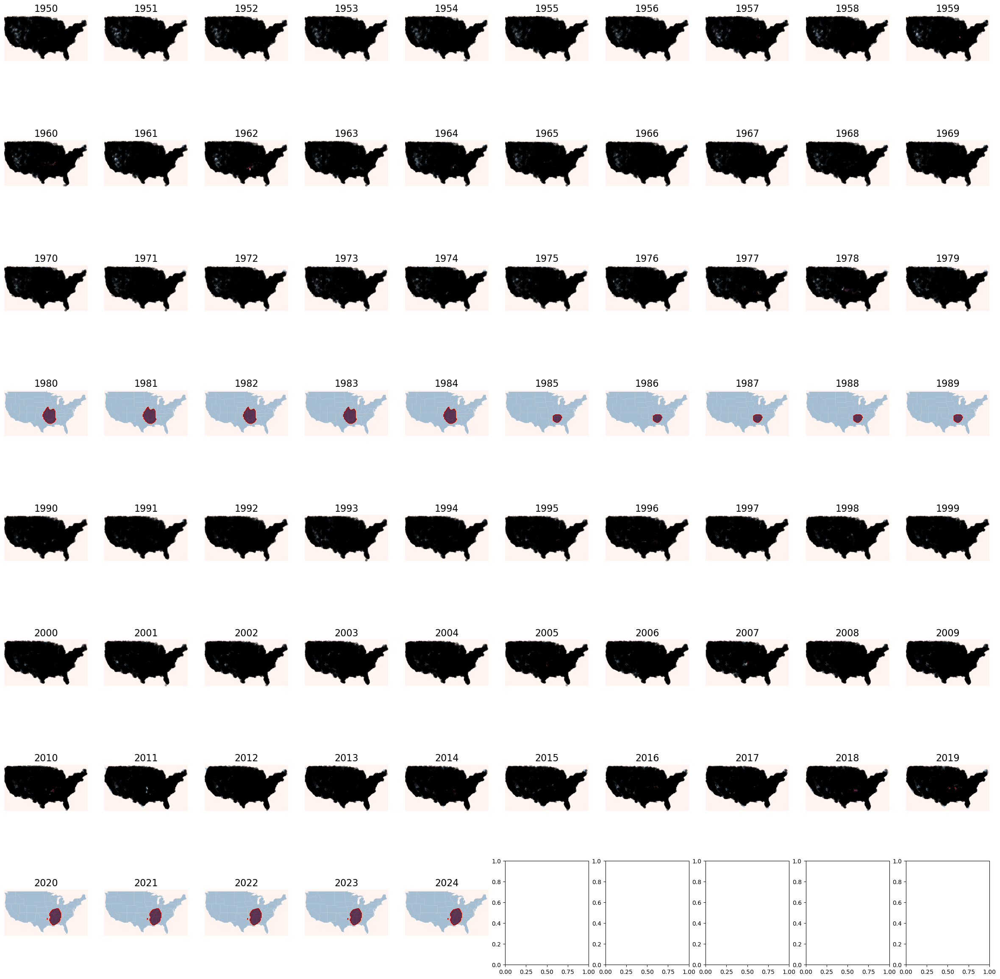

In [ ]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    density = tornado_kdes(year,positions).reshape(xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    contour = ax.contourf(xx, yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    year_predictions = predictions_df[predictions_df['DATE'] == year]
    year_predictions = year_predictions[year_predictions['predictions'] < 0.5]
 
    pos_pts_x = year_predictions['LONGITUDE'].values
    pos_pts_y = year_predictions['LATITUDE'].values

    ax.scatter(pos_pts_x, pos_pts_y, c='black', s=10, alpha=0.3)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


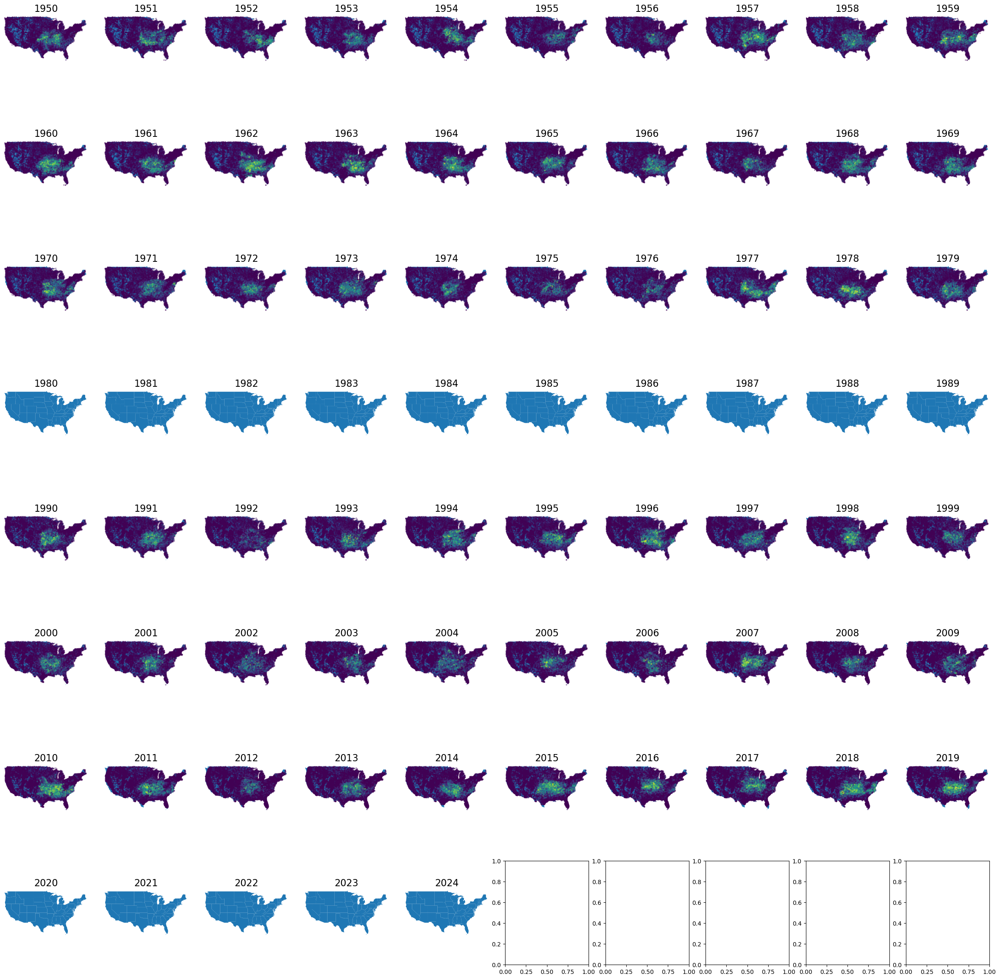

In [ ]:
years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    density = tornado_kdes(year,positions).reshape(xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    year_predictions = predictions_df[predictions_df['DATE'] == year]

 
    pos_pts_x = year_predictions['LONGITUDE'].values
    pos_pts_y = year_predictions['LATITUDE'].values

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    ax.scatter(pos_pts_x, pos_pts_y, c=year_predictions['predictions'], s=10, alpha=0.3,marker='.')
    #contour = ax.contourf(xx, yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

As it stands, this code assigns classifications to weather stations. Ultimately, though, what we're interested in is classifying land as in or not-in Tornado Alley. As such, let's convolve the predict_proba values with a Gaussian Kernel to obtain a mixture distribution that assigns a probability for each point in the US being in Tornado Alley.

In [ ]:
predictions_df

,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,CLDD,DP01,DP10,DP1X,DT00,...,TMAX,TMIN,DSND,DSNW,EMSD,EMSN,SNOW,DYFG,tornado_alley,predictions
73228,1950,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1341.735086,104.000000,77.000000,14.000000,0.000000,...,26.067506,12.622880,0.000000,0.000000,0.000000,0.000000,0.000000,30.141174,0,0.000000
73229,1957,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1311.032930,95.000000,77.000000,14.000000,0.000000,...,25.515139,13.456971,0.000000,0.000000,0.000000,0.000000,0.000000,32.607199,0,0.090909
73230,1958,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1266.894815,90.000000,73.000000,13.000000,0.000000,...,24.575579,11.766309,1.000000,1.000000,25.000000,25.000000,25.000000,35.907665,0,0.181818
73231,1959,31.57020,-85.24820,139.0,"ABBEVILLE, AL US",1297.643358,96.000000,79.000000,17.000000,0.000000,...,25.029862,12.686546,0.000000,0.000000,0.000000,0.000000,0.000000,10.541029,0,0.090909
73306,1950,34.41667,-87.31667,302.1,"ADDISON CENTRAL TOWER, AL US",935.780952,124.129893,83.896073,19.342884,0.000000,...,21.841915,10.787106,1.000000,1.000000,76.000000,76.000000,76.000000,62.732118,1,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
680105,2015,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",571.700000,109.000000,67.000000,10.000000,10.000000,...,17.670000,5.470000,21.728947,3.737868,257.913558,70.422663,267.688305,76.145173,0,0.272727
680106,2016,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",654.100000,87.000000,52.000000,9.000000,6.000000,...,18.360000,6.310000,24.618878,4.831510,183.668195,155.904403,526.851372,70.522834,0,0.363636
680107,2017,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",579.400000,84.000000,57.000000,9.000000,6.000000,...,17.980000,5.540000,15.519591,3.943548,92.827091,83.822394,258.722362,57.792966,0,0.181818
680108,2018,40.69540,-96.85410,418.2,"LINCOLN 11 SW, NE US",651.000000,103.000000,66.000000,9.000000,7.000000,...,16.170000,4.380000,50.084134,13.723489,142.883543,162.080228,1060.386763,78.184530,0,0.181818


Processing year 1950
Processing year 1960
Processing year 1970
Processing year 1980
Processing year 1990
Processing year 2000
Processing year 2010
Processing year 2020


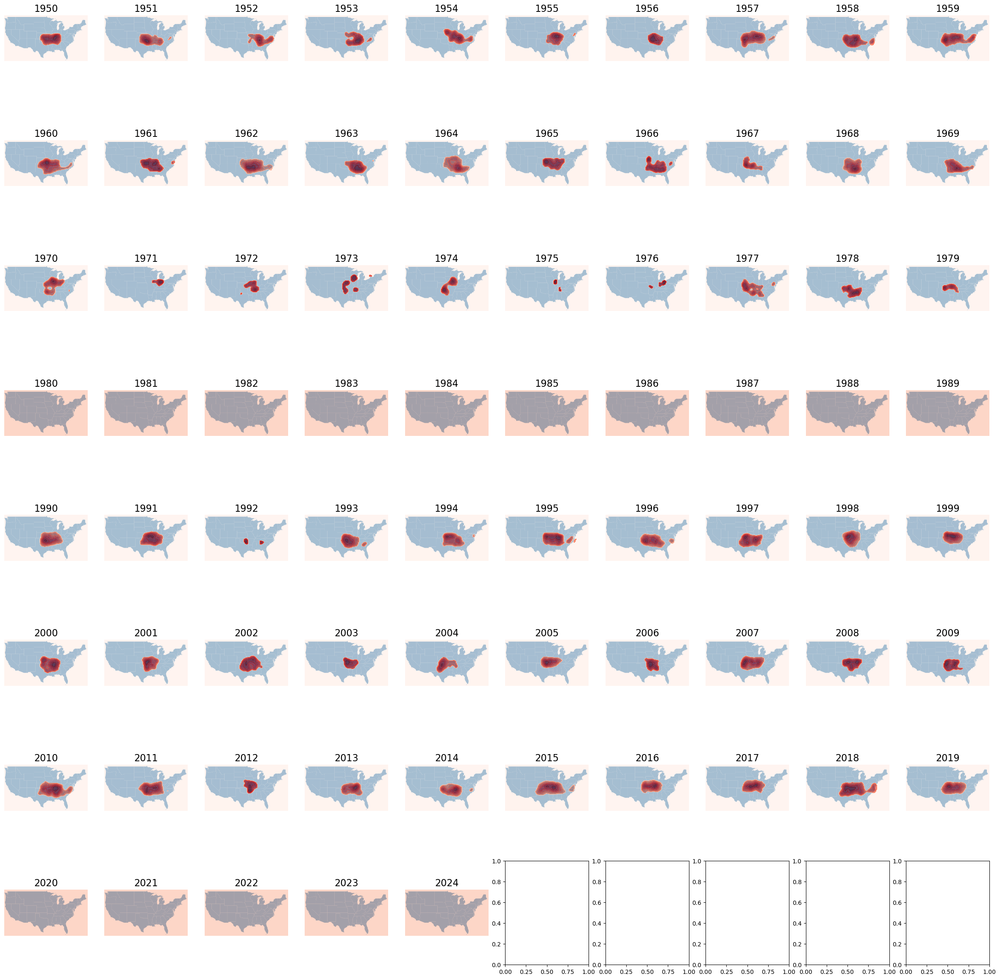

In [ ]:
AVERAGING_WIDTH = 1
DECISION_THRESHOLD = .25
#accept_kdes = kernel_density_averaging(predictions_df,AVERAGING_BANDWIDTH)

years = np.arange(1950,2025,1)

fig, axs = plt.subplots(8,10)
fig.set_size_inches(30,30)

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])

grid_pred_df = predictions_to_grid(predictions_df,positions.transpose(),predictions_df['DATE'].unique())

for year in years:
    if year % 10 == 0:
        print('Processing year ' + str(year))
    plot_x = (year - 1950) % 10
    plot_y = (year - 1950) // 10

    year_preds = np.zeros(xx.shape)

    year_df = grid_pred_df[grid_pred_df['DATE'] == year]
    if year_df.shape[0] != 0:
        year_df = average_predicts(year_df, AVERAGING_WIDTH)

        year_preds = np.array(year_df['preds']).reshape(xx.shape)

    tornado_alley = year_preds * (year_preds > DECISION_THRESHOLD)

    #year_predictions = predictions_df[predictions_df['DATE'] == year]

    #pos_pts_x = year_predictions['LONGITUDE'].values
    #pos_pts_y = year_predictions['LATITUDE'].values

    ax = axs[plot_y,plot_x]
    states.plot(ax=ax)

    #ax.scatter(pos_pts_x, pos_pts_y, c=year_predictions['predictions'], s=10, alpha=0.3,marker='.')
    contour = ax.contourf(xx, yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    ax.set_title(str(year), fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()

### The Main Train-Test Split

In [34]:

num_neighbors = 7
train_df,test_df,remaining_kde_df,cv_splits = create_all_test_train_splits(kde_climate_df,test_years,features_to_interpolate)



knn_pipe = make_pipeline(StandardScaler(),KNeighborsClassifier(n_neighbors=num_neighbors,weights='distance'))
knn_pipe.fit(train_df[features],train_df['tornado_alley'])
test_predicts = knn_pipe.predict_proba(test_df[features])
test_df['predictions'] = test_predicts[:,1]
test_df['binary_predictions'] = knn_pipe.predict(test_df[features])

predictions_df = test_df.copy()

C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_5584\620061023.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['predictions'] = test_predicts[:,1]
C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_5584\620061023.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['binary_predictions'] = knn_pipe.predict(test_df[features])


In [ ]:
def ground_truth_classification_plot(predict_df,year,grid_xx,grid_yy,tornado_alley,ax):
    states.plot(ax=ax)

    ax.contourf(grid_xx, grid_yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    tornado_x = tornado_df[tornado_df['year_bin']==year]['begin_lon'].values
    tornado_y = tornado_df[tornado_df['year_bin']==year]['begin_lat'].values
    ax.scatter(tornado_x, tornado_y, c='black', s=10, alpha=0.3)

    ax.set_title(str(year) + " F3–F5 Tornadoes and Tornado Alley", fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def accepted_pt_classification_plot(predict_df,year,grid_xx,grid_yy,tornado_alley,ax):
    states.plot(ax=ax)

    contour = ax.contourf(grid_xx, grid_yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)
    year_predictions = predict_df[predict_df['DATE'] == year]
    year_predictions = year_predictions[year_predictions['predictions'] > 0.5]

    pos_pts_x = year_predictions['LONGITUDE'].values
    pos_pts_y = year_predictions['LATITUDE'].values

    ax.scatter(pos_pts_x, pos_pts_y, c='black', s=10, alpha=0.3)

    ax.set_title(str(year) + " Accepted Weather Stations", fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def predict_tornado_alley_classification_plot(grid_predict_df,year,grid_xx,grid_yy,grid_positions,ax):
    year_df = grid_predict_df[grid_predict_df['DATE'] == year]
    year_df = average_predicts(year_df, AVERAGING_WIDTH)

    year_preds = np.array(year_df['preds']).reshape(xx.shape)

    tornado_alley = (year_preds > DECISION_THRESHOLD)

    states.plot(ax=ax)

    contour = ax.contourf(grid_xx, grid_yy, tornado_alley, levels=10, cmap='Reds', alpha=0.6)

    ax.set_title(str(year) + ' Predicted Tornado Alley', fontsize=16)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_axis_off()
    return ax

def classification_year_plot(predict_df,year,grid_xx,grid_yy,grid_positions):
    
    density = tornado_kdes(year,grid_positions).reshape(grid_xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    ground_truth_classification_plot(predict_df,year,grid_xx,grid_yy,tornado_alley,axs[0])
    accepted_pt_classification_plot(predict_df,year,grid_xx,grid_yy,tornado_alley,axs[1])

    grid_pred_df = predictions_to_grid(predict_df,positions.transpose(),[year],'predictions')
    predict_tornado_alley_classification_plot(grid_pred_df,year,grid_xx,grid_yy,grid_positions,axs[2])

    return (fig, axs)

In [ ]:
years = list(range(1980,1990)) + list(range(2020,2025))

plt.ioff()

AVERAGING_WIDTH = 1
DECISION_THRESHOLD = .4

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:200j, ymin:ymax:200j]
positions = np.vstack([xx.ravel(), yy.ravel()])

for year in years:
    fig, axs = plt.subplots(1,3,figsize=(30,10))
    fig, axs = classification_year_plot(predictions_df, year, xx, yy, positions)
    fig.savefig('classification_' + str(year) + '.png')

C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_5584\2449092344.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,3,figsize=(30,10))


In [81]:
plt.ion()

### Trends in the Mean Location of Predicted Regions

In [88]:
def center_of_mass_predicted_classification_region(predict_df,grid_xx,grid_yy,grid_positions,year):
    density = tornado_kdes(year,grid_positions).reshape(grid_xx.shape)
    tornado_alley = np.stack(np.vectorize(lambda x: x > REQUIRED_FREQ)(density),axis=0)

    grid_pred_df = predictions_to_grid(predict_df,grid_positions.transpose(),[year],'predictions')

    year_df = grid_pred_df[grid_pred_df['DATE'] == year]
    year_df = average_predicts(year_df, AVERAGING_WIDTH)

    year_preds = np.array(year_df['preds']).reshape(xx.shape)

    tornado_alley = (year_preds > DECISION_THRESHOLD)

    mean_x = np.sum(xx * tornado_alley)/np.sum(tornado_alley)
    mean_y = np.sum(yy * tornado_alley)/np.sum(tornado_alley)

    return (mean_x, mean_y)

In [96]:
AVERAGING_WIDTH = 1
DECISION_THRESHOLD = .4

xmin, xmax = -125, -66
ymin, ymax = 24, 50

xx, yy = np.mgrid[xmin:xmax:200j, ymin:ymax:200j]
positions = np.vstack([xx.ravel(), yy.ravel()])

xmeans = []
ymeans = []
for year in years:
    x,y = center_of_mass_predicted_classification_region(predictions_df,xx,yy,positions,year)
    xmeans.append(x)
    ymeans.append(y)

mean_classification_df = pd.DataFrame()
mean_classification_df['year'] = years
mean_classification_df['xmean'] = xmeans
mean_classification_df['ymean'] = ymeans

mean_classification_df

,year,xmean,ymean
0,1980,-88.259760,35.341173
1,1981,-92.521133,39.116913
2,1982,-92.277999,35.827429
3,1983,-90.327848,35.854271
4,1984,-92.721939,36.260187
5,1985,-94.458261,35.069910
6,1986,-92.457284,36.880341
7,1987,-93.139823,37.591691
8,1988,-91.273242,36.609189
9,1989,-92.736642,35.464810


C:\Users\Matthew Dannenberg\AppData\Local\Temp\ipykernel_5584\2355857082.py:12: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


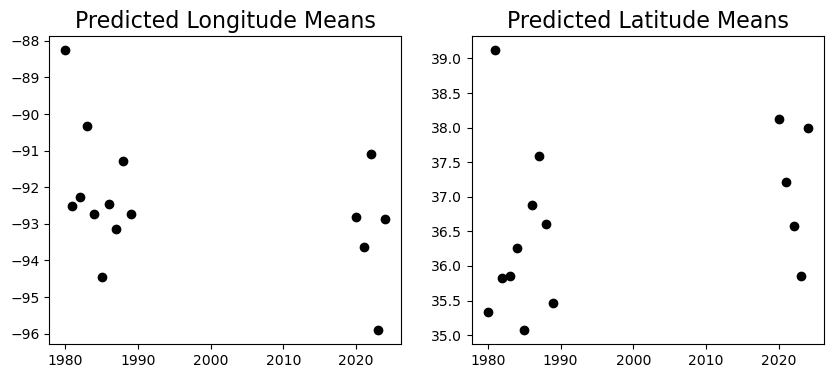

In [104]:
fig, axs = plt.subplots(1,2,figsize=(10,4))
ax0 = axs[0]
ax1 = axs[1]

ax0.scatter(mean_classification_df['year'],mean_classification_df['xmean'],c='black')
ax0.set_title('Predicted Longitude Means', fontsize=16)

ax1.scatter(mean_classification_df['year'],mean_classification_df['ymean'],c='black')
ax1.set_title('Predicted Latitude Means', fontsize=16)


fig.show()